In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))
import os, sys
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from glob import glob

PROJECT_PATH = os.path.join('..')
sys.path.append(PROJECT_PATH)
from parameters import param_keys, general_keys
from models.classifiers.deepHits_nans_norm_crop_stamp_model import \
  DeepHiTSNanNormCropStampModel
from models.classifiers.deepHits_entopy_reg_model import DeepHiTSEntropyRegModel
from models.classifiers.deepHits_with_features_entropy_reg import \
  DeepHiTSWithFeaturesEntropyReg
from modules.data_loaders.frame_to_input_with_features import \
  FrameToInputWithFeatures
import pickle
from notebooks.evaluate_unlabeled_data import get_predictions_of_chunk
from modules.data_set_generic import Dataset
from scripts.plot_confusion_matrix import plot_confusion_matrix, plot_cm_std
from sklearn.metrics import confusion_matrix
from glob import glob
import tensorflow as tf
import ephem
from modules.coords import ec2gal

/home/rcarrasco/anaconda3/envs/tf1/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/rcarrasco/anaconda3/envs/tf1/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/rcarrasco/anaconda3/envs/tf1/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/rcarrasco/anaconda3/envs/tf1/lib/python3

In [2]:
data_dir = '../../pickles/'
#data_path = os.path.join(os.path.join(data_dir, "training_set_May-06-2020.pkl"))
data_path = os.path.join(os.path.join(data_dir, "training_set_Jun-22-2020.pkl"))
labeled_dataset = pd.read_pickle(data_path)
labeled_dataset.loc[labeled_dataset.isdiffpos == "f", "isdiffpos"] = 0.0
labeled_dataset.loc[labeled_dataset.isdiffpos == "t", "isdiffpos"] = 1.0

features_keys = ['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3',
                 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb',
                 'distnr', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long',
                 'gal_lat', 'gal_long', 'non_detections', "chinr", "sharpnr", "elong"]

for fk in features_keys:
    labeled_dataset[fk] = labeled_dataset[fk].astype("float64")
    
clipping_values = {"sgscore1": [-1, "max"],
                   "distpsnr1": [-1, "max"],
                   "sgscore2": [-1, "max"],
                   "distpsnr2": [-1, "max"],
                   "sgscore3": [-1, "max"],
                   "distpsnr3": [-1, "max"],
                   "fwhm": ["min", 10], 
                   "distnr": [-1, "max"],
                   "magnr": [-1, "max"],
                   "ndethist": ["min", 20],
                   "ncovhist": ["min", 3000],
                   "chinr": [-1, 15],
                   "sharpnr": [-1, 1.5],
                   "non_detections": ["min", 2000],#}
                   "chipsf": ["min", 10],
                   "aimagerat": [-1, 2],
                   "bimagerat": [-1, 2],
                   "seeratio": [-1, 5]}
                   

for k, clip_range in clipping_values.items():
    if clip_range[0] == "min":
        lower_clip = np.min(labeled_dataset[k])
    else:
        lower_clip = clip_range[0]
    if clip_range[1] == "max":
        upper_clip = np.max(labeled_dataset[k])
    else:
        upper_clip = clip_range[1]
        
    labeled_dataset[k] = labeled_dataset[k].clip(lower=lower_clip, upper=upper_clip)

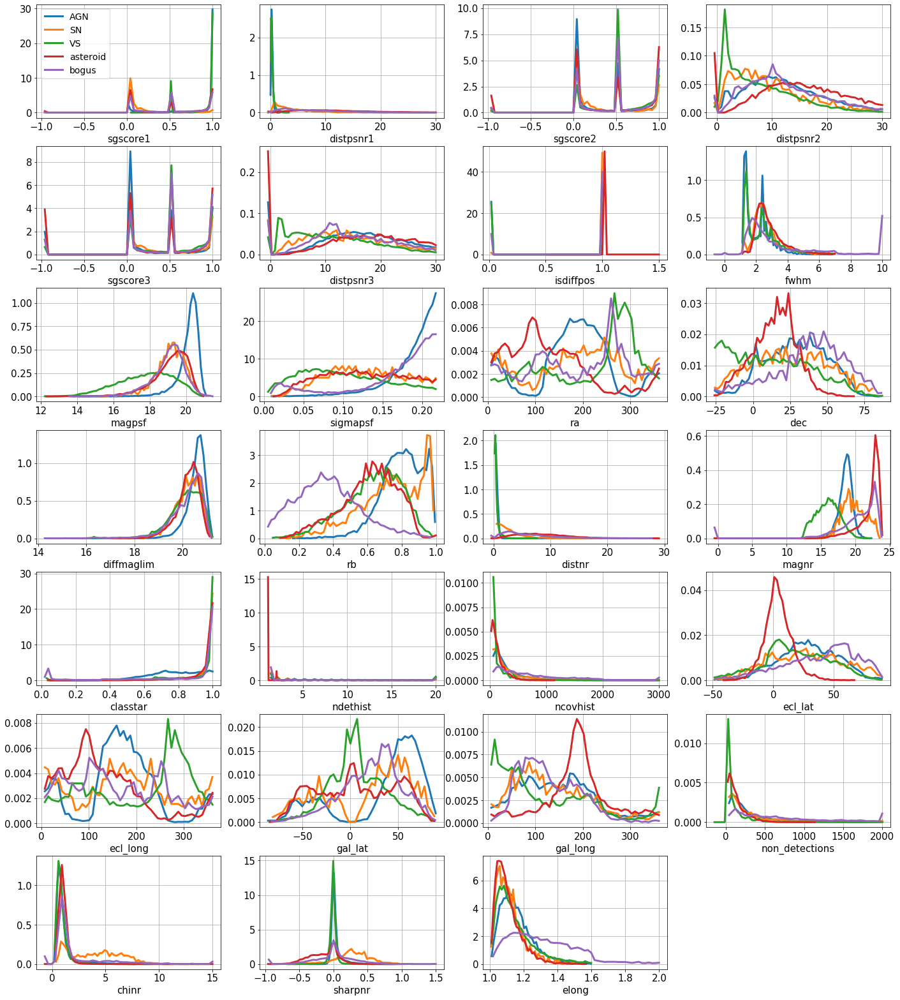

In [3]:
def trim_axs(axs, N):
    """little helper to massage the axs list to have correct length..."""
    axs = axs.flat
    for ax in axs[N:]:
        ax.remove()
    return axs[:N]

sub_class_metadata = {}
for cl in np.unique(labeled_dataset["class"]):
    sub_class_metadata[cl] = labeled_dataset[labeled_dataset["class"] == cl][features_keys]

fontsize = 15
n_bins = 50
cols = 4
rows = 9
f, ax = plt.subplots(rows, cols, figsize=(6*cols, 4*rows))
ax = trim_axs(ax, 27)
for i, fk in enumerate(features_keys):
    for cl, md in sub_class_metadata.items():
        values = md[fk].values
        values = values[np.logical_not(np.isnan(values))]
        h, b = np.histogram(md[fk], bins=n_bins, density=True)
        ax[i].plot(b[1:], h, lw=3, label=cl)
    if i == 0:
        ax[i].legend(fontsize=fontsize-1)
    ax[i].tick_params(axis='both', labelsize=fontsize)
    ax[i].set_xlabel(fk, fontsize=fontsize)
    #ax.set_ylabel("Normalized histogram", fontsize=fontsize)
    ax[i].grid()
plt.subplots_adjust(wspace=0.21, hspace=0.25)
plt.savefig("revision_plots/features_grid.pdf", bbox_inches="tight")
plt.show()

# Unlabeled set feature distribution

In [4]:
list_of_frames = glob('../../pickles/large_space_uniform/unlabeled_set_images_*.pkl')
list_of_frames

['../../pickles/large_space_uniform/unlabeled_set_images_2.pkl',
 '../../pickles/large_space_uniform/unlabeled_set_images_1.pkl',
 '../../pickles/large_space_uniform/unlabeled_set_images_0.pkl',
 '../../pickles/large_space_uniform/unlabeled_set_images_4.pkl',
 '../../pickles/large_space_uniform/unlabeled_set_images_3.pkl']

In [6]:
all_features = []

for unlabeled_set in list_of_frames:
    print(unlabeled_set)
    dataset = pd.read_pickle(unlabeled_set)
    dataset.loc[dataset.isdiffpos == "f", "isdiffpos"] = 0.0
    dataset.loc[dataset.isdiffpos == "t", "isdiffpos"] = 1.0

    features_keys = ['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3',
                     'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb',
                     'distnr', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long',
                     'gal_lat', 'gal_long', 'non_detections', "chinr", "sharpnr", "elong"]

    for fk in features_keys:
        dataset[fk] = dataset[fk].astype("float64")

    clipping_values = {"sgscore1": [-1, "max"],
                       "distpsnr1": [-1, "max"],
                       "sgscore2": [-1, "max"],
                       "distpsnr2": [-1, "max"],
                       "sgscore3": [-1, "max"],
                       "distpsnr3": [-1, "max"],
                       "fwhm": ["min", 10], 
                       "distnr": [-1, "max"],
                       "magnr": [-1, "max"],
                       "ndethist": ["min", 20],
                       "ncovhist": ["min", 3000],
                       "chinr": [-1, 15],
                       "sharpnr": [-1, 1.5],
                       "non_detections": ["min", 2000]}


    for k, clip_range in clipping_values.items():
        if clip_range[0] == "min":
            lower_clip = np.min(dataset[k])
        else:
            lower_clip = clip_range[0]
        if clip_range[1] == "max":
            upper_clip = np.max(dataset[k])
        else:
            upper_clip = clip_range[1]

        dataset[k] = dataset[k].clip(lower=lower_clip, upper=upper_clip)
        
    all_features.append(dataset[features_keys])
all_features = pd.concat(all_features, axis=0)
all_features.to_pickle('../../pickles/large_space_uniform/all_features.pkl')

../../pickles/large_space_uniform/unlabeled_set_images_2.pkl
../../pickles/large_space_uniform/unlabeled_set_images_1.pkl
../../pickles/large_space_uniform/unlabeled_set_images_0.pkl
../../pickles/large_space_uniform/unlabeled_set_images_4.pkl
../../pickles/large_space_uniform/unlabeled_set_images_3.pkl


In [7]:
all_features = pd.read_pickle('../../pickles/large_space_uniform/all_features.pkl')

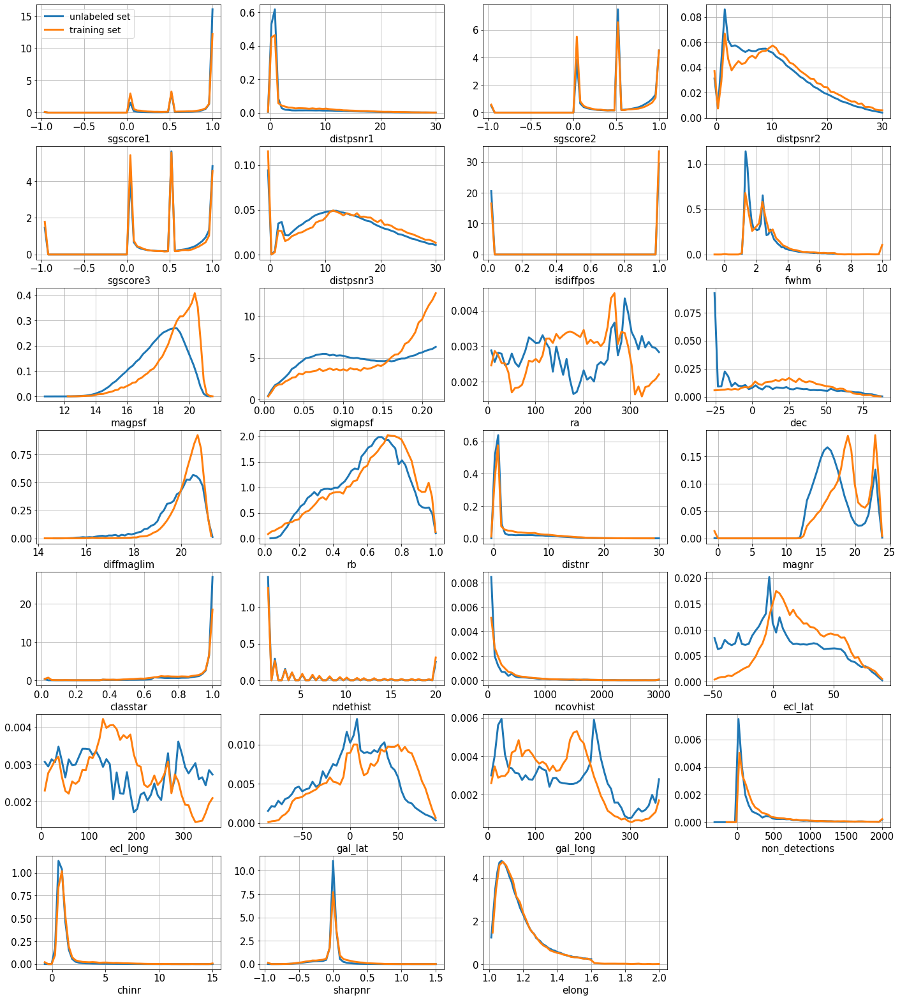

In [8]:
f, ax = plt.subplots(rows, cols, figsize=(6*cols, 4*rows))
ax = trim_axs(ax, 27)
for i, fk in enumerate(features_keys):
    values = all_features[fk].values
    values = values[np.logical_not(np.isnan(values))]
    h, b = np.histogram(values, bins=n_bins, density=True)
    ax[i].plot(b[1:], h, lw=3, label="unlabeled set")
    
    values = labeled_dataset[fk].values
    values = values[np.logical_not(np.isnan(values))]
    h, b = np.histogram(values, bins=n_bins, density=True)
    ax[i].plot(b[1:], h, lw=3, label="training set")
    
    if i == 0:
        ax[i].legend(fontsize=fontsize-1)
    
    ax[i].tick_params(axis='both', labelsize=fontsize)
    ax[i].set_xlabel(fk, fontsize=fontsize)
    #ax.set_ylabel("Normalized histogram", fontsize=fontsize)
    ax[i].grid()
plt.subplots_adjust(wspace=0.21, hspace=0.25)
plt.show()

## Evaluating models without all features

In [10]:
def return_cm_plot(model_paths, features_key=[], features_clip={}, ax=None):
    tf.reset_default_graph()
    # instance model and load weights
    data_dir = '../../pickles/'
    #data_path = os.path.join(os.path.join(data_dir, "training_set_May-06-2020.pkl"))
    DATA_PATH = os.path.join(os.path.join(data_dir, "training_set_Jun-22-2020.pkl"))
    # DATA_PATH = "../../pickles/converted_data.pkl"
    N_CLASSES = 5

    n_classes = 5
    params = {
      param_keys.RESULTS_FOLDER_NAME: 'aux_model',
      param_keys.DATA_PATH_TRAIN: DATA_PATH,
      param_keys.WAIT_FIRST_EPOCH: False,
      param_keys.N_INPUT_CHANNELS: 3,
      param_keys.CHANNELS_TO_USE: [0, 1, 2],
      param_keys.TRAIN_ITERATIONS_HORIZON: 30000,
      param_keys.TRAIN_HORIZON_INCREMENT: 10000,
      param_keys.TEST_SIZE: n_classes * 100,
      param_keys.VAL_SIZE: n_classes * 100,
      param_keys.NANS_TO: 0,
      param_keys.NUMBER_OF_CLASSES: n_classes,
      param_keys.CROP_SIZE: 21,
      param_keys.INPUT_IMAGE_SIZE: 21,
      param_keys.LEARNING_RATE: 0.001,

      param_keys.VALIDATION_MONITOR: general_keys.LOSS,
      param_keys.VALIDATION_MODE: general_keys.MIN,
      param_keys.ENTROPY_REG_BETA: 0.5,
      param_keys.DROP_RATE: 0.5,
      param_keys.BATCH_SIZE: 64,
      param_keys.KERNEL_SIZE: 3,
      param_keys.FEATURES_NAMES_LIST: [
        'oid'] + features_key,
      param_keys.BATCHNORM_FEATURES_FC: True,
      param_keys.FEATURES_CLIPPING_DICT: features_clip}
    aux_model = DeepHiTSWithFeaturesEntropyReg(params)
    params = aux_model.params
    train_set, val_set, test_set = aux_model._prepare_input()
    aux_model.close()
    del aux_model
    
    params.update(
      {param_keys.FEATURES_NAMES_LIST: features_key})
    
    feature_model_list = []
    for model_path in model_paths:
        graph = tf.Graph()
        config = tf.ConfigProto()
        config.gpu_options.allow_growth = True
        sess = tf.Session(graph=graph, config=config)
        with graph.as_default():
            if len(features_key) == 0:
                model = DeepHiTSEntropyRegModel(params, session=sess)
            else:
                model = DeepHiTSWithFeaturesEntropyReg(params, session=sess)
            checkpoint_path_best_so_far = os.path.join(model_path, "checkpoints", 'model')
            model.load_model(checkpoint_path_best_so_far)
            feature_model_list.append(model)
            
    normalize_cm = True
    class_names = np.array(['AGN', 'SN', 'VS', 'asteroid', "bogus"])
    all_cms = []

    predictions_with_features_per_model = []

    acc = []
    for model in feature_model_list:
        if len(features_key) == 0:
            y_pred = model.predict(test_set.data_array)
        else:
            y_pred = model.predict(test_set.data_array, features=test_set.meta_data[:, 1:])
        acc.append(np.mean(y_pred==test_set.data_label))
        cm = confusion_matrix(test_set.data_label, y_pred)
        if normalize_cm:
            cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
            print('Normalized confusion matrix Acc %.4f' % (np.trace(cm)/np.sum(cm)))
        all_cms.append(cm)

    print(np.mean(acc), np.std(acc))
    all_cms = np.stack(all_cms)
    mean_cm, std_cm = np.mean(all_cms, axis=0), np.std(all_cms, axis=0)

    p = plot_cm_std(mean_cm=mean_cm, std_cm=std_cm, title="", classes=class_names, 
                    normalize=True, label_fontsize=14, axis_fontsize=14, colorbar=False, ax=ax)

    
def remove_feature(feature_list, clipping_values, feature_to_remove):
    if feature_to_remove is None:
        return feature_list, clipping_values
    
    new_list = []
    for f in feature_list:
        if f == feature_to_remove:
            continue
        else:
            new_list.append(f)

    new_clip = {}
    for key, val in clipping_values.items():
        if key == feature_to_remove:
            continue
        else:
            new_clip[key] = val
    return new_list, new_clip

def get_predictions_of_chunk(chunk_data_path, training_set_path, model_path, with_features=True, features_key=[], features_clip={}):
    DATA_PATH = training_set_path
    N_CLASSES = n_classes = 5
    tf.reset_default_graph()
    

    params = param_keys.default_params.copy()
    params.update({
      param_keys.RESULTS_FOLDER_NAME: 'aux_model',
      param_keys.DATA_PATH_TRAIN: DATA_PATH,
      param_keys.WAIT_FIRST_EPOCH: False,
      param_keys.N_INPUT_CHANNELS: 3,
      param_keys.CHANNELS_TO_USE: [0, 1, 2],
      param_keys.TRAIN_ITERATIONS_HORIZON: 30000,
      param_keys.TRAIN_HORIZON_INCREMENT: 10000,
      param_keys.TEST_SIZE: n_classes * 100,
      param_keys.VAL_SIZE: n_classes * 100,
      param_keys.NANS_TO: 0,
      param_keys.NUMBER_OF_CLASSES: n_classes,
      param_keys.CROP_SIZE: 21,
      param_keys.INPUT_IMAGE_SIZE: 21,
      param_keys.LEARNING_RATE: 0.001,

      param_keys.VALIDATION_MONITOR: general_keys.LOSS,
      param_keys.VALIDATION_MODE: general_keys.MIN,
      param_keys.ENTROPY_REG_BETA: 0.5,
      param_keys.DROP_RATE: 0.5,
      param_keys.BATCH_SIZE: 64,
      param_keys.KERNEL_SIZE: 3,
      param_keys.FEATURES_NAMES_LIST: [
        'oid'] + features_key,
      param_keys.BATCHNORM_FEATURES_FC: True,
      param_keys.FEATURES_CLIPPING_DICT: features_clip})

    frame_to_input = FrameToInputWithFeatures(params)
    frame_to_input.set_dumping_data_to_pickle(False)
    frame_to_input.dataset_preprocessor.set_pipeline(
              [frame_to_input.dataset_preprocessor.image_check_single_image,
               frame_to_input.dataset_preprocessor.image_clean_misshaped,
               frame_to_input.dataset_preprocessor.image_select_channels,
               frame_to_input.dataset_preprocessor.image_crop_at_center,
               frame_to_input.dataset_preprocessor.image_normalize_by_image,
               frame_to_input.dataset_preprocessor.image_nan_to_num,
               frame_to_input.dataset_preprocessor.features_clip,
               frame_to_input.dataset_preprocessor.features_normalize
               ])

    _ = frame_to_input.get_preprocessed_datasets_splitted()

    DATA_PATH = chunk_data_path
    N_CLASSES = 5

    features_keys = ['oid',] + features_key

    params = param_keys.default_params.copy()
    params.update({
        param_keys.RESULTS_FOLDER_NAME: 'clipped_feat_and_batchnorm',
        param_keys.DATA_PATH_TRAIN: DATA_PATH,
        param_keys.WAIT_FIRST_EPOCH: False,
        param_keys.N_INPUT_CHANNELS: 3,
        param_keys.CHANNELS_TO_USE: [0, 1, 2],
        param_keys.TRAIN_ITERATIONS_HORIZON: 30000,
        param_keys.TRAIN_HORIZON_INCREMENT: 10000,
        param_keys.TEST_SIZE: N_CLASSES * 100,
        param_keys.VAL_SIZE: N_CLASSES * 100,
        param_keys.NANS_TO: 0,
        param_keys.NUMBER_OF_CLASSES: N_CLASSES,
        param_keys.CROP_SIZE: 21,
        param_keys.INPUT_IMAGE_SIZE: 21,
        param_keys.VALIDATION_MONITOR: general_keys.LOSS,
        param_keys.VALIDATION_MODE: general_keys.MIN,
        param_keys.ENTROPY_REG_BETA: 0.3,
        param_keys.LEARNING_RATE: 1e-4,
        param_keys.DROP_RATE: 0.5,
        param_keys.BATCH_SIZE: 64,
        param_keys.KERNEL_SIZE: 3,
        param_keys.FEATURES_NAMES_LIST: features_keys,
        param_keys.BATCHNORM_FEATURES_FC: True,
        param_keys.FEATURES_CLIPPING_DICT: features_clip
        })

    data_loader = FrameToInputWithFeatures(params)
    data_loader.set_dumping_data_to_pickle(False)

    unlabeled_dataset = data_loader.get_raw_dataset_unsplitted()

    NEW_DATA_IMAGES = unlabeled_dataset.data_array
    NEW_DATA_FEATURES = unlabeled_dataset.meta_data
    NEW_DATA_LABELS = unlabeled_dataset.data_label

    NEW_DATA_DATASET = Dataset(data_array=NEW_DATA_IMAGES, data_label=NEW_DATA_LABELS,
                               meta_data=NEW_DATA_FEATURES, batch_size=None)

    preprocessor = frame_to_input.get_dataset_preprocessor()
    preprocessed_dataset = preprocessor.preprocess_dataset(NEW_DATA_DATASET)

    images, features = preprocessed_dataset.data_array, preprocessed_dataset.meta_data[:, 1:]
    oid = preprocessed_dataset.meta_data[:, 0]

    params.update(
        {param_keys.FEATURES_NAMES_LIST: features_key,
         param_keys.DATA_PATH_TRAIN: None})

    graph = tf.Graph()
    config = tf.ConfigProto()
    config.gpu_options.allow_growth = True
    sess = tf.Session(graph=graph, config=config)
    print("###################### PRINTING PARAMS ##################")
    print(params[param_keys.FEATURES_NAMES_LIST])
    with graph.as_default():
        if with_features:
            model = DeepHiTSWithFeaturesEntropyReg(params, session=sess)
        else:
            model = DeepHiTSEntropyRegModel(params, session=sess)
        checkpoint_path_best_so_far = os.path.join(model_path, "checkpoints", 'model')
        model.load_model(checkpoint_path_best_so_far)

    if with_features:
        y_pred = model.predict(images, features=features)
        y_prob = model.predict_proba(images, features=features)
    else:
        y_pred = model.predict(images)
        y_prob = model.predict_proba(images)

    return oid, y_pred, y_prob

def plot_latitude_densities(unlabeled_set_frame, preds, oid, title=""):
    %matplotlib inline
    fontsize=16
    predicted_classes_keys = {0: 'AGN', 1: 'SN',2: 'VS',3: 'asteroid', 4: 'bogus'}
    n_bins = 30
    bins_gal = np.linspace(np.amin(unlabeled_set_frame["gal_lat"]),
                           np.amax(unlabeled_set_frame["gal_lat"]),
                           num=n_bins)
    bins_ecl = np.linspace(np.amin(unlabeled_set_frame["ecl_lat"]),
                           np.amax(unlabeled_set_frame["ecl_lat"]),
                           num=n_bins)

    f, ax = plt.subplots(1, 5, figsize=(30, 6))

    h_gal, bins = np.histogram(unlabeled_set_frame["gal_lat"].values, bins=bins_gal, density=True)
    h_ecl, bins = np.histogram(unlabeled_set_frame["ecl_lat"].values, bins=bins_ecl, density=True)
    ax[0].plot(bins_gal[:-1], h_gal, label="galactic latitude density")
    ax[0].plot(bins_ecl[:-1], h_ecl, label="ecliptic latitude density")
    ax[0].legend(fontsize=fontsize)
    ax[0].set_xlabel("Latitude", fontsize=fontsize)
    ax[0].set_ylabel(title, fontsize=fontsize)

    for cl in range(5):
        oids_per_class = [oid[preds==cl] for cl in np.unique(preds)]
        
        latitude = unlabeled_set_frame.loc[oids_per_class[cl]]['gal_lat'].values
        h, bins = np.histogram(latitude, bins=bins_gal, density=True)
        ax[1].plot(bins[:-1], h, label=predicted_classes_keys[cl])
        ax[1].set_xlabel("Galactic Latitude", fontsize=fontsize)
        ax[1].set_title("Gal lat distribution per class", fontsize=fontsize)
        ax[1].legend(fontsize=fontsize)

        latitude = unlabeled_set_frame.loc[oids_per_class[cl]]['ecl_lat'].values
        h, bins = np.histogram(latitude, bins=bins_ecl, density=True)
        ax[2].plot(bins[:-1], h, label=predicted_classes_keys[cl])
        ax[2].set_xlabel("Ecliptic Latitude", fontsize=fontsize)
        ax[2].set_title("Ecl lat distribution per class", fontsize=fontsize)
        ax[2].legend(fontsize=fontsize)

        latitude = unlabeled_set_frame.loc[oids_per_class[cl]]['gal_lat'].values
        h, bins = np.histogram(latitude, bins=bins_gal, density=True)
        ax[3].plot(bins[:-1], np.divide(h, h_gal), label=predicted_classes_keys[cl])
        ax[3].set_xlabel("Galactic Latitude", fontsize=fontsize)
        ax[3].set_title("Normalized Gal lat distribution per class", fontsize=fontsize)
        ax[3].legend(fontsize=fontsize)

        latitude = unlabeled_set_frame.loc[oids_per_class[cl]]['ecl_lat'].values
        h, bins = np.histogram(latitude, bins=bins_ecl, density=True)
        ax[4].plot(bins[:-1], np.divide(h, h_ecl), label=predicted_classes_keys[cl])
        ax[4].set_xlabel("Ecliptic Latitude", fontsize=fontsize)
        ax[4].set_title("Normalized Ecl lat distribution per class", fontsize=fontsize)
        ax[4].legend(fontsize=fontsize)
        
    plt.show()
    
#plot_latitude_densities(coordinates_df, preds, preds_ids)

In [9]:
model_paths = glob("../results/removing_features_testing/*")
model_paths

['../results/removing_features_testing/sigmapsf_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3.log',
 '../results/removing_features_testing/NoFeatures_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-164211',
 '../results/removing_features_testing/magpsf_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-160748',
 '../results/removing_features_testing/magnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-153934',
 '../results/removing_features_testing/AllFeatures_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3.log',
 '../results/removing_features_testing/distpsnr1_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3.log',
 '../results/removing_features_testing/NoFeatures_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_0_202


Instructions for updating:
Use `for ... in dataset:` to iterate over a dataset. If using `tf.estimator`, return the `Dataset` object directly from your input function. As a last resort, you can use `tf.compat.v1.data.make_initializable_iterator(dataset)`.

Instructions for updating:
Use `tf.compat.v1.data.get_output_types(dataset)`.
Instructions for updating:
Use `tf.compat.v1.data.get_output_shapes(dataset)`.

Instructions for updating:
Use `tf.keras.layers.Conv2D` instead.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Use keras.layers.MaxPooling2D instead.
Instructions for updating:
Use keras.layers.flatten instead.
Instructions for updating:
Use keras.layers.dense instead.
Instructions for updating:
Use keras.layers.dropout instead.
Instructions for updating:
Use keras.layers.BatchNormalization instead.  In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be u

  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:35<00:00, 1471.53it/s]


Dumping to /home/rcarrasco/Projects/stamp_classifier/stamp_classifier/../pickles/converted_data.pkl...
Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 28)
Replicationg data from (array([0, 1, 2, 3, 4]), array([14542,  1396, 14523,  9599, 10534]))
to (array([0, 1, 2, 3, 4]), array([14542, 14542, 14542, 14542, 14542]))
Instructions for updating:
Use standard file APIs to check for files with this prefix.
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/AllFeatures_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-144326/checkpoints/model
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/AllFeatures_EntropyRegBeta0.5000_batch64_lr0.0010

  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:36<00:00, 1426.39it/s]


Dumping to /home/rcarrasco/Projects/stamp_classifier/stamp_classifier/../pickles/converted_data.pkl...
Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 27)
Replicationg data from (array([0, 1, 2, 3, 4]), array([14542,  1396, 14523,  9599, 10534]))
to (array([0, 1, 2, 3, 4]), array([14542, 14542, 14542, 14542, 14542]))
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distpsnr1_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_0_20200623-145027/checkpoints/model
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distpsnr1_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-150430/checkpoints/mode

  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:36<00:00, 1430.64it/s]


Dumping to /home/rcarrasco/Projects/stamp_classifier/stamp_classifier/../pickles/converted_data.pkl...
Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 26)
Replicationg data from (array([0, 1, 2, 3, 4]), array([14542,  1396, 14523,  9599, 10534]))
to (array([0, 1, 2, 3, 4]), array([14542, 14542, 14542, 14542, 14542]))
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-152537/checkpoints/model
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_0_20200623-151133/checkpoints/model
INFO

  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:36<00:00, 1447.16it/s]


Dumping to /home/rcarrasco/Projects/stamp_classifier/stamp_classifier/../pickles/converted_data.pkl...
Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 25)
Replicationg data from (array([0, 1, 2, 3, 4]), array([14542,  1396, 14523,  9599, 10534]))
to (array([0, 1, 2, 3, 4]), array([14542, 14542, 14542, 14542, 14542]))
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/magnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-153934/checkpoints/model
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/magnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_0_20200623-153236/checkpoints/model
INFO:t

  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:36<00:00, 1438.04it/s]


Dumping to /home/rcarrasco/Projects/stamp_classifier/stamp_classifier/../pickles/converted_data.pkl...
Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 24)
Replicationg data from (array([0, 1, 2, 3, 4]), array([14542,  1396, 14523,  9599, 10534]))
to (array([0, 1, 2, 3, 4]), array([14542, 14542, 14542, 14542, 14542]))
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/magpsf_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-160748/checkpoints/model
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/magpsf_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-160048/checkpoints/model
INFO

  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:36<00:00, 1450.20it/s]


Dumping to /home/rcarrasco/Projects/stamp_classifier/stamp_classifier/../pickles/converted_data.pkl...
Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 23)
Replicationg data from (array([0, 1, 2, 3, 4]), array([14542,  1396, 14523,  9599, 10534]))
to (array([0, 1, 2, 3, 4]), array([14542, 14542, 14542, 14542, 14542]))
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/sigmapsf_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-162136/checkpoints/model
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/sigmapsf_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_0_20200623-161441/checkpoints/model


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:35<00:00, 1464.45it/s]


Dumping to /home/rcarrasco/Projects/stamp_classifier/stamp_classifier/../pickles/converted_data.pkl...
Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 1)
Replicationg data from (array([0, 1, 2, 3, 4]), array([14542,  1396, 14523,  9599, 10534]))
to (array([0, 1, 2, 3, 4]), array([14542, 14542, 14542, 14542, 14542]))
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/NoFeatures_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-164211/checkpoints/model
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/NoFeatures_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_0_20200623-163527/checkpoints/model
INFO:tensorfl

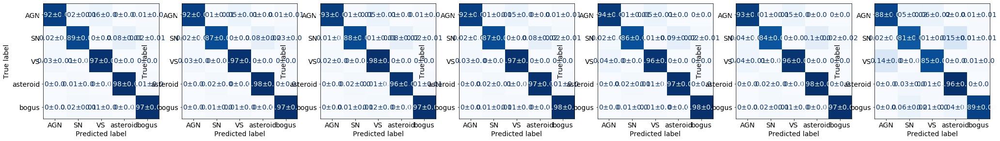

In [10]:
%matplotlib inline

features_list = ['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3',
                'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb',
                'distnr', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long',
                'gal_lat', 'gal_long', 'non_detections', "chinr", "sharpnr", "elong"]

features_clip = {"sgscore1": [-1, "max"], "distpsnr1": [-1, "max"], "sgscore2": [-1, "max"], "distpsnr2": [-1, "max"],
                 "sgscore3": [-1, "max"], "distpsnr3": [-1, "max"], "fwhm": ["min", 10], "distnr": [-1, "max"], "magnr": [-1, "max"],
                 "ndethist": ["min", 20], "ncovhist": ["min", 3000], "chinr": [-1, 15], "sharpnr": [-1, 1.5], "non_detections": ["min", 2000]}

model_names = ["AllFeatures", "distpsnr1_removed", "distnr_removed", "magnr_removed", "magpsf_removed", "sigmapsf_removed", "NoFeatures"]
features_removed = [None, "distpsnr1", "distnr", "magnr", "magpsf", "sigmapsf", None]

f, ax = plt.subplots(1, len(model_names), figsize=(5*len(model_names), 5))
for i, model_key in enumerate(model_names):
    single_model_path = glob("../results/removing_features_testing/" + model_key + "_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_*")
    features_list, features_clip = remove_feature(features_list, features_clip, features_removed[i])
    if model_key == "NoFeatures":
        features_list = []
    new_ax = return_cm_plot(model_paths=single_model_path, features_key=features_list, features_clip=features_clip, ax=ax[i])
plt.show()

In [12]:
features_list = ['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3',
                'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb',
                'distnr', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long',
                'gal_lat', 'gal_long', 'non_detections', "chinr", "sharpnr", "elong"]

features_clip = {"sgscore1": [-1, "max"], "distpsnr1": [-1, "max"], "sgscore2": [-1, "max"], "distpsnr2": [-1, "max"],
                 "sgscore3": [-1, "max"], "distpsnr3": [-1, "max"], "fwhm": ["min", 10], "distnr": [-1, "max"], "magnr": [-1, "max"],
                 "ndethist": ["min", 20], "ncovhist": ["min", 3000], "chinr": [-1, 15], "sharpnr": [-1, 1.5], "non_detections": ["min", 2000]}

model_names = ["AllFeatures", "distpsnr1_removed", "distnr_removed", "magnr_removed", "magpsf_removed", "sigmapsf_removed", "NoFeatures"]
features_removed = [None, "distpsnr1", "distnr", "magnr", "magpsf", "sigmapsf", None]

coordinates_df = pd.read_pickle('../../pickles/large_space_uniform/coordinate_df.pkl')
coordinates_df.set_index("oid", inplace=True)
list_of_frames = glob('../../pickles/large_space_uniform/unlabeled_set_images_*.pkl')


for i, model_key in enumerate(model_names):
    print("#################### " + model_key + " ########################")
    single_model_path = glob("../results/removing_features_testing/" + model_key + "_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_*")
    features_list, features_clip = remove_feature(features_list, features_clip, features_removed[i])
    
    if model_key == "NoFeatures":
        features_list = []
        with_features = False
    else:
        with_features = True
    
    data_dir = '../../pickles/'
    model_path = single_model_path[0]
    training_set_path = os.path.join(os.path.join(data_dir, "training_set_Jun-22-2020.pkl"))

    prediction_df = []

    for frame_path in list_of_frames:
        print(frame_path)
        predictions = get_predictions_of_chunk(frame_path, training_set_path, model_path, 
                                               with_features=with_features,  features_key=features_list,
                                               features_clip=features_clip)
        prediction_df.append(predictions)
    
    pred_file_name = os.path.join("../../pickles/large_space_uniform/", model_key+"_pred.pkl")
    pickle.dump(prediction_df, open(pred_file_name, 'wb'), protocol=2)
    

#################### AllFeatures ########################
../../pickles/large_space_uniform/unlabeled_set_images_2.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:37<00:00, 1397.57it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 28)
{'unlabeled': 0}


100%|██████████| 75774/75774 [00:49<00:00, 1534.92it/s]



927 misshaped samples removed

1688 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'distnr', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']

Instructions for updating:
Use `for ... in dataset:` to iterate over a dataset. If using `tf.estimator`, return the `Dataset` object directly from your input function. As a last resort, you can use `tf.compat.v1.data.make_initializable_iterator(dataset)`.

Instructions for updating:
Use `tf.compat.v1.data.get_output_types(dataset)`.
Instructions for updating:
Use `tf.compat.v1.data.get_output_shapes(dataset)`.

Instructions for updating:
Use `tf.keras.layers.Conv2D` instead.
Instructions for updating:
Call initializer instance with the dtype argument 

  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:36<00:00, 1419.44it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 28)
{'unlabeled': 0}


100%|██████████| 78070/78070 [00:50<00:00, 1532.45it/s]



1079 misshaped samples removed

2161 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'distnr', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/AllFeatures_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-144326/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_0.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:37<00:00, 1379.98it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 28)
{'unlabeled': 0}


100%|██████████| 78598/78598 [00:52<00:00, 1508.51it/s]



894 misshaped samples removed

2138 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'distnr', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/AllFeatures_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-144326/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_4.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:37<00:00, 1398.43it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 28)
{'unlabeled': 0}


100%|██████████| 78848/78848 [00:50<00:00, 1552.29it/s]



904 misshaped samples removed

2260 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'distnr', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/AllFeatures_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-144326/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_3.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:37<00:00, 1406.53it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 28)
{'unlabeled': 0}


100%|██████████| 78209/78209 [00:51<00:00, 1525.21it/s]



853 misshaped samples removed

2027 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'distnr', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/AllFeatures_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-144326/checkpoints/model
#################### distpsnr1_removed ########################
../../pickles/large_space_uniform/unlabeled_set_images_2.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:39<00:00, 1328.60it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 27)
{'unlabeled': 0}


100%|██████████| 75774/75774 [00:49<00:00, 1530.90it/s]



927 misshaped samples removed

1688 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'distnr', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distpsnr1_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_0_20200623-145027/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_1.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:37<00:00, 1404.57it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 27)
{'unlabeled': 0}


100%|██████████| 78070/78070 [00:50<00:00, 1531.57it/s]



1079 misshaped samples removed

2161 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'distnr', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distpsnr1_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_0_20200623-145027/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_0.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:36<00:00, 1415.79it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 27)
{'unlabeled': 0}


100%|██████████| 78598/78598 [00:47<00:00, 1647.49it/s]



894 misshaped samples removed

2138 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'distnr', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distpsnr1_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_0_20200623-145027/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_4.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:36<00:00, 1414.22it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 27)
{'unlabeled': 0}


100%|██████████| 78848/78848 [00:47<00:00, 1659.67it/s]



904 misshaped samples removed

2260 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'distnr', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distpsnr1_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_0_20200623-145027/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_3.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:37<00:00, 1399.91it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 27)
{'unlabeled': 0}


100%|██████████| 78209/78209 [00:51<00:00, 1510.76it/s]



853 misshaped samples removed

2027 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'distnr', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distpsnr1_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_0_20200623-145027/checkpoints/model
#################### distnr_removed ########################
../../pickles/large_space_uniform/unlabeled_set_images_2.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:37<00:00, 1411.20it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 26)
{'unlabeled': 0}


100%|██████████| 75774/75774 [00:50<00:00, 1512.58it/s]



927 misshaped samples removed

1688 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-152537/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_1.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:40<00:00, 1305.36it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 26)
{'unlabeled': 0}


100%|██████████| 78070/78070 [00:53<00:00, 1453.09it/s]



1079 misshaped samples removed

2161 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-152537/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_0.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:38<00:00, 1369.43it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 26)
{'unlabeled': 0}


100%|██████████| 78598/78598 [00:53<00:00, 1462.69it/s]



894 misshaped samples removed

2138 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-152537/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_4.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:39<00:00, 1317.64it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 26)
{'unlabeled': 0}


100%|██████████| 78848/78848 [00:52<00:00, 1496.76it/s]



904 misshaped samples removed

2260 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-152537/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_3.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:39<00:00, 1310.62it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 26)
{'unlabeled': 0}


100%|██████████| 78209/78209 [00:52<00:00, 1494.25it/s]



853 misshaped samples removed

2027 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-152537/checkpoints/model
#################### magnr_removed ########################
../../pickles/large_space_uniform/unlabeled_set_images_2.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:38<00:00, 1343.80it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 25)
{'unlabeled': 0}


100%|██████████| 75774/75774 [00:50<00:00, 1506.96it/s]



927 misshaped samples removed

1688 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/magnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-153934/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_1.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:38<00:00, 1363.65it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 25)
{'unlabeled': 0}


100%|██████████| 78070/78070 [00:52<00:00, 1488.94it/s]



1079 misshaped samples removed

2161 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/magnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-153934/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_0.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:38<00:00, 1365.38it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 25)
{'unlabeled': 0}


100%|██████████| 78598/78598 [00:52<00:00, 1487.83it/s]



894 misshaped samples removed

2138 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/magnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-153934/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_4.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:39<00:00, 1310.12it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 25)
{'unlabeled': 0}


100%|██████████| 78848/78848 [00:53<00:00, 1474.63it/s]



904 misshaped samples removed

2260 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/magnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-153934/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_3.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:40<00:00, 1285.61it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 25)
{'unlabeled': 0}


100%|██████████| 78209/78209 [00:48<00:00, 1613.95it/s]



853 misshaped samples removed

2027 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/magnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-153934/checkpoints/model
#################### magpsf_removed ########################
../../pickles/large_space_uniform/unlabeled_set_images_2.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:38<00:00, 1365.60it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 24)
{'unlabeled': 0}


100%|██████████| 75774/75774 [00:50<00:00, 1499.27it/s]



927 misshaped samples removed

1688 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/magpsf_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-160748/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_1.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:38<00:00, 1342.58it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 24)
{'unlabeled': 0}


100%|██████████| 78070/78070 [00:53<00:00, 1468.01it/s]



1079 misshaped samples removed

2161 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/magpsf_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-160748/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_0.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:38<00:00, 1361.22it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 24)
{'unlabeled': 0}


100%|██████████| 78598/78598 [00:52<00:00, 1487.96it/s]



894 misshaped samples removed

2138 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/magpsf_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-160748/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_4.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:40<00:00, 1296.55it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 24)
{'unlabeled': 0}


100%|██████████| 78848/78848 [00:48<00:00, 1635.52it/s]



904 misshaped samples removed

2260 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/magpsf_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-160748/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_3.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:39<00:00, 1336.62it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 24)
{'unlabeled': 0}


100%|██████████| 78209/78209 [00:54<00:00, 1443.73it/s]



853 misshaped samples removed

2027 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/magpsf_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200623-160748/checkpoints/model
#################### sigmapsf_removed ########################
../../pickles/large_space_uniform/unlabeled_set_images_2.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:39<00:00, 1319.10it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 23)
{'unlabeled': 0}


100%|██████████| 75774/75774 [00:51<00:00, 1472.69it/s]



927 misshaped samples removed

1688 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/sigmapsf_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-162136/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_1.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:39<00:00, 1325.85it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 23)
{'unlabeled': 0}


100%|██████████| 78070/78070 [00:52<00:00, 1475.84it/s]



1079 misshaped samples removed

2161 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/sigmapsf_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-162136/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_0.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:39<00:00, 1322.65it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 23)
{'unlabeled': 0}


100%|██████████| 78598/78598 [00:53<00:00, 1465.13it/s]



894 misshaped samples removed

2138 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/sigmapsf_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-162136/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_4.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:40<00:00, 1294.66it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 23)
{'unlabeled': 0}


100%|██████████| 78848/78848 [00:53<00:00, 1464.97it/s]



904 misshaped samples removed

2260 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/sigmapsf_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-162136/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_3.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:37<00:00, 1411.36it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 23)
{'unlabeled': 0}


100%|██████████| 78209/78209 [00:53<00:00, 1458.85it/s]



853 misshaped samples removed

2027 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/sigmapsf_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-162136/checkpoints/model
#################### NoFeatures ########################
../../pickles/large_space_uniform/unlabeled_set_images_2.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:38<00:00, 1340.79it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 1)
{'unlabeled': 0}


100%|██████████| 75774/75774 [00:51<00:00, 1476.82it/s]



927 misshaped samples removed

1688 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
[]
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/NoFeatures_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-164211/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_1.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:40<00:00, 1293.31it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 1)
{'unlabeled': 0}


100%|██████████| 78070/78070 [00:52<00:00, 1491.27it/s]



1079 misshaped samples removed

2161 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
[]
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/NoFeatures_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-164211/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_0.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:35<00:00, 1451.61it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 1)
{'unlabeled': 0}


100%|██████████| 78598/78598 [00:49<00:00, 1600.88it/s]



894 misshaped samples removed

2138 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
[]
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/NoFeatures_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-164211/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_4.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:40<00:00, 1291.56it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 1)
{'unlabeled': 0}


100%|██████████| 78848/78848 [00:53<00:00, 1463.35it/s]



904 misshaped samples removed

2260 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
[]
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/NoFeatures_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-164211/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_3.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:41<00:00, 1247.10it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 1)
{'unlabeled': 0}


100%|██████████| 78209/78209 [00:54<00:00, 1445.39it/s]



853 misshaped samples removed

2027 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
[]
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/NoFeatures_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_1_20200623-164211/checkpoints/model


# Spatial distribution

#################### AllFeatures ########################


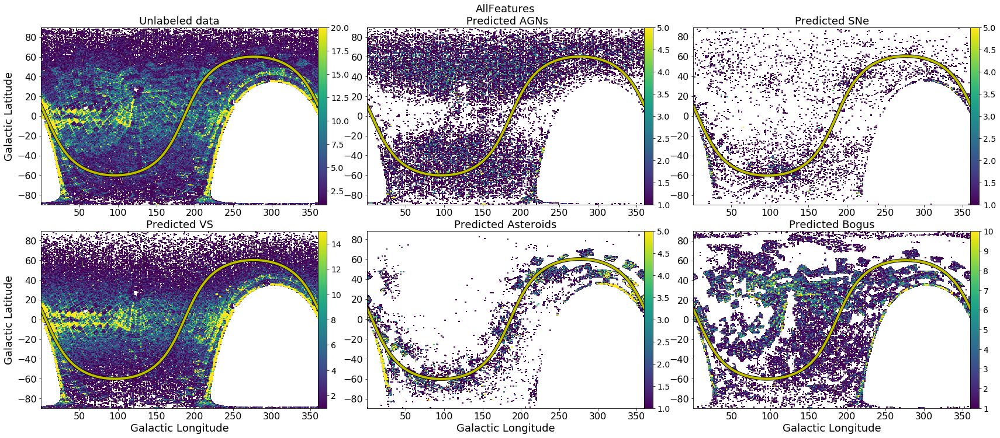

#################### distpsnr1_removed ########################


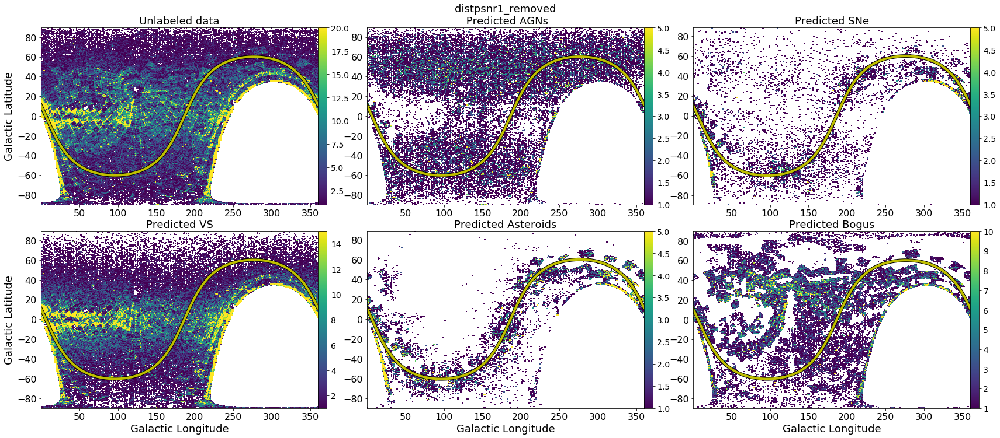

#################### distnr_removed ########################


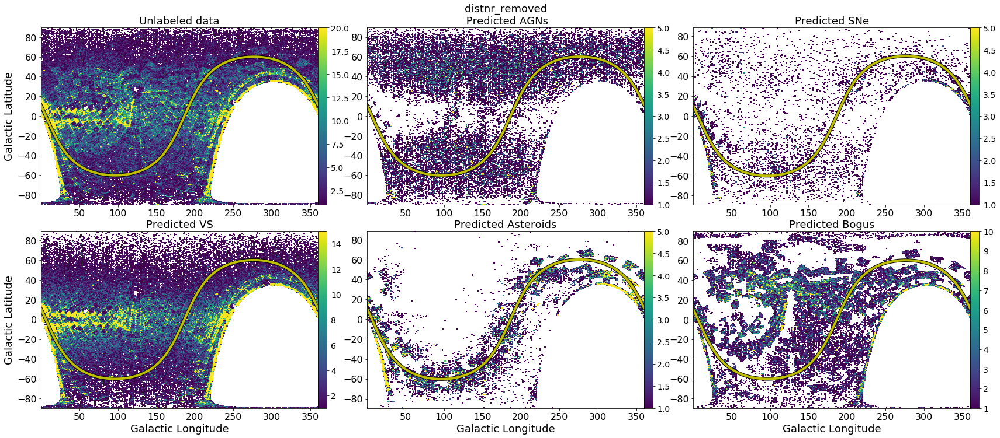

#################### magnr_removed ########################


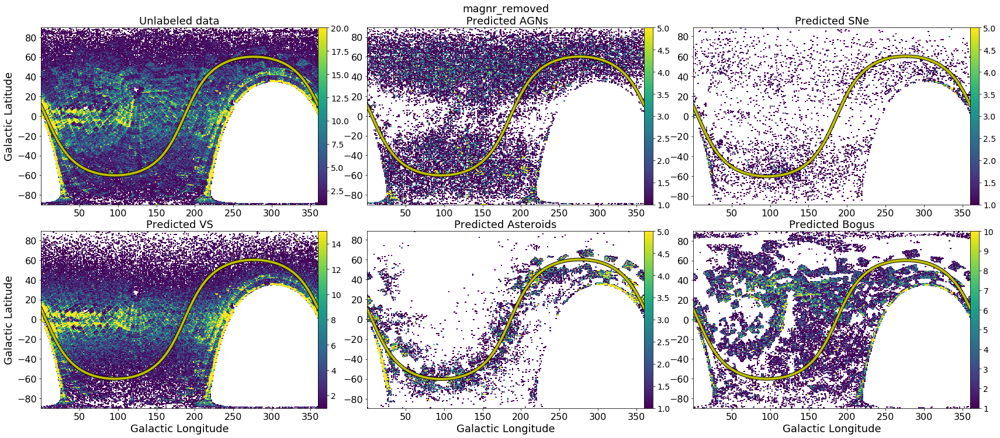

#################### magpsf_removed ########################


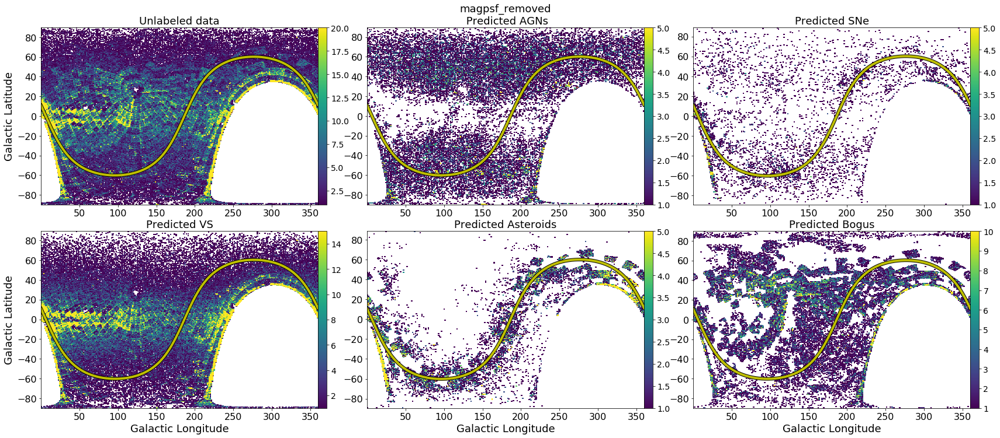

#################### sigmapsf_removed ########################


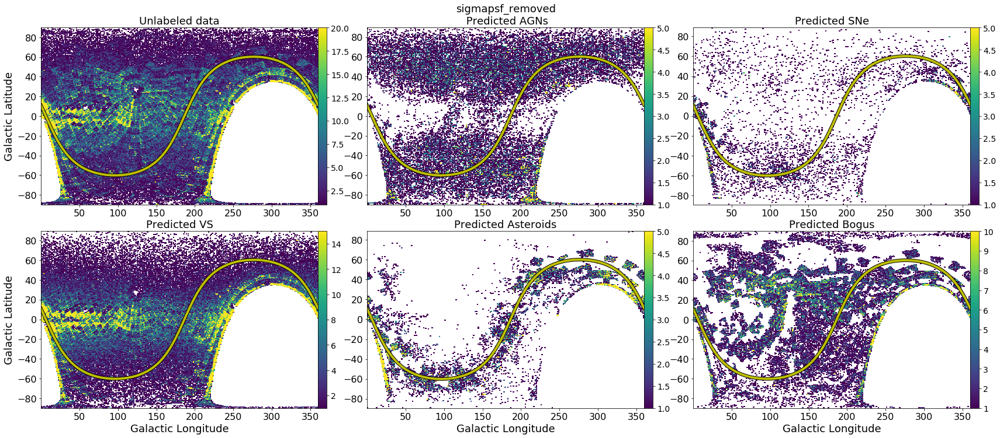

#################### NoFeatures ########################


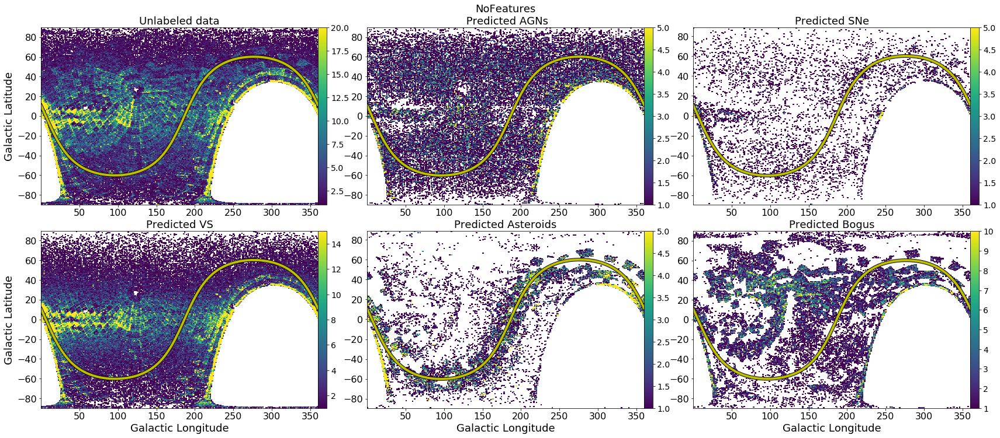

In [14]:
%matplotlib inline

features_list = ['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3',
                'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb',
                'distnr', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long',
                'gal_lat', 'gal_long', 'non_detections', "chinr", "sharpnr", "elong"]

features_clip = {"sgscore1": [-1, "max"], "distpsnr1": [-1, "max"], "sgscore2": [-1, "max"], "distpsnr2": [-1, "max"],
                 "sgscore3": [-1, "max"], "distpsnr3": [-1, "max"], "fwhm": ["min", 10], "distnr": [-1, "max"], "magnr": [-1, "max"],
                 "ndethist": ["min", 20], "ncovhist": ["min", 3000], "chinr": [-1, 15], "sharpnr": [-1, 1.5], "non_detections": ["min", 2000]}

model_names = ["AllFeatures", "distpsnr1_removed", "distnr_removed", "magnr_removed", "magpsf_removed", "sigmapsf_removed", "NoFeatures"]
features_removed = [None, "distpsnr1", "distnr", "magnr", "magpsf", "sigmapsf", None]

coordinates_df = pd.read_pickle('../../pickles/large_space_uniform/coordinate_df.pkl')
coordinates_df.set_index("oid", inplace=True)
list_of_frames = glob('../../pickles/large_space_uniform/unlabeled_set_images_*.pkl')


for i, model_key in enumerate(model_names):
    print("#################### " + model_key + " ########################")
    single_model_path = glob("../results/removing_features_testing/" + model_key + "_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_*")
    features_list, features_clip = remove_feature(features_list, features_clip, features_removed[i])
    
    if model_key == "NoFeatures":
        features_list = []
        with_features = False
    else:
        with_features = True
    
    data_dir = '../../pickles/'
    model_path = single_model_path[0]
    training_set_path = os.path.join(os.path.join(data_dir, "training_set_Jun-22-2020.pkl"))

    pred_file_name = os.path.join("../../pickles/large_space_uniform/", model_key+"_pred.pkl")
    prediction_df = pd.read_pickle(pred_file_name)
    
    preds_ids = []
    preds = []
    for ids, p, _ in prediction_df:
        preds_ids.append(ids)
        preds.append(p)
    preds_ids = np.concatenate(preds_ids)
    preds = np.concatenate(preds)
    
    
    f, ax = plt.subplots(2, 3, figsize=(3*10, 2*6))
    plt.subplots_adjust(wspace=0.0, hspace=0.15)
    ax = ax.flatten()
    vmax_values = [20, 5, 5, 15, 5, 10]
    cmin_values = [0.1, 0.1, 0.1, 0.1, 0.1, 0.1]
    titles = ["Unlabeled data", model_key+"\n Predicted AGNs", "Predicted SNe", "Predicted VS", "Predicted Asteroids", "Predicted Bogus"]
    fontsize = 18
    dims = ['gal_long', 'gal_lat']

    ecliptic_lat = np.linspace(0, 0, num=500)
    ecliptic_longi = np.linspace(0, 360, num=500)
    galact_long, galact_lat = ec2gal(ecliptic_longi, ecliptic_lat)

    for i in range(6):
        if i==0:
            _, _, _, im = ax[i].hist2d(coordinates_df[dims].values[:, 0], coordinates_df[dims].values[:, 1], (300, 300), cmap="viridis", vmax=vmax_values[i], cmin=cmin_values[i])
        else:
            oids_per_class = [preds_ids[preds==i-1] for cl in np.unique(preds)]
            df = coordinates_df.loc[oids_per_class[i-1]]
            _, _, _, im = ax[i].hist2d(df[dims].values[:, 0], df[dims].values[:, 1], (300, 300), cmap="viridis", vmax=vmax_values[i], cmin=cmin_values[i])
        if i==0 or i==3:
            ax[i].set_ylabel("Galactic Latitude", fontsize=fontsize)
        if i==3 or i==4 or i==5:
            ax[i].set_xlabel("Galactic Longitude", fontsize=fontsize)

        ax[i].tick_params(axis='both', labelsize=fontsize-2)
        cbar = plt.colorbar(im,ax=ax[i], pad=0)
        cbar.ax.tick_params(labelsize=fontsize-4)
        ax[i].set_title(titles[i], fontsize=fontsize)
        ax[i].plot(galact_long, galact_lat, "-k", lw=6)
        ax[i].plot(galact_long, galact_lat, "-y", lw=4)
    plt.show()

# Latitude histograms

#################### AllFeatures ########################


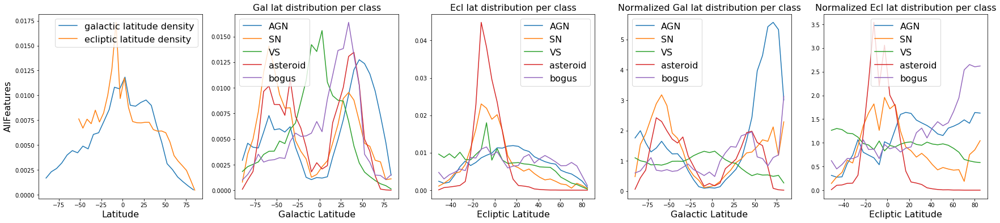

#################### distpsnr1_removed ########################


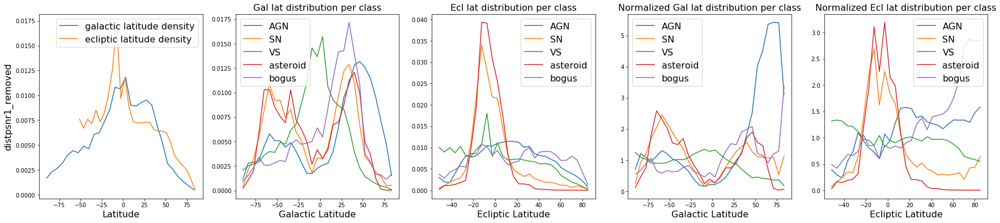

#################### distnr_removed ########################


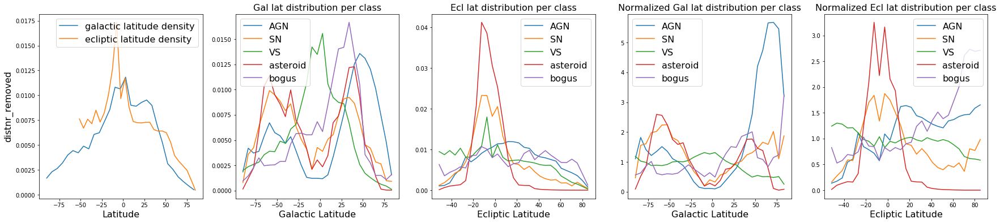

#################### magnr_removed ########################


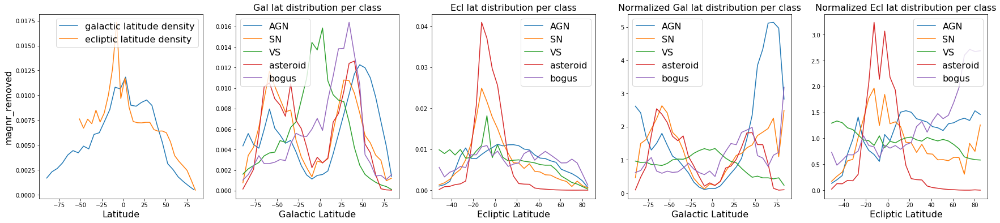

#################### magpsf_removed ########################


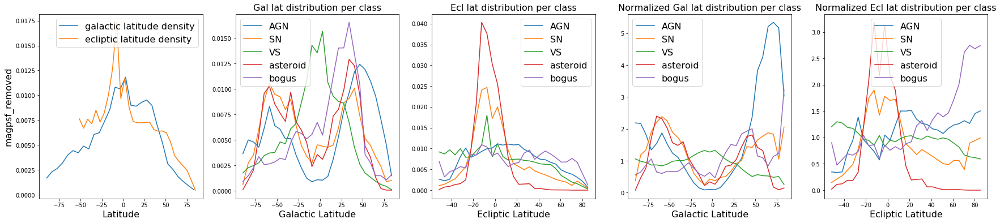

#################### sigmapsf_removed ########################


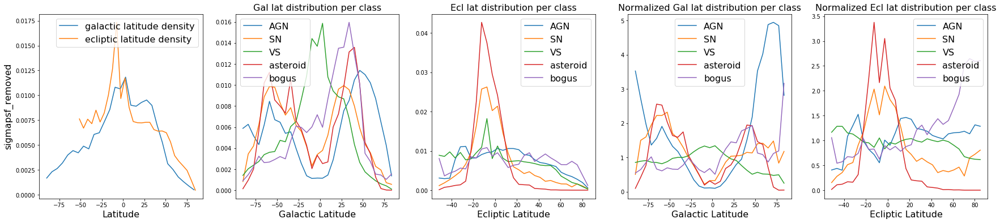

#################### NoFeatures ########################


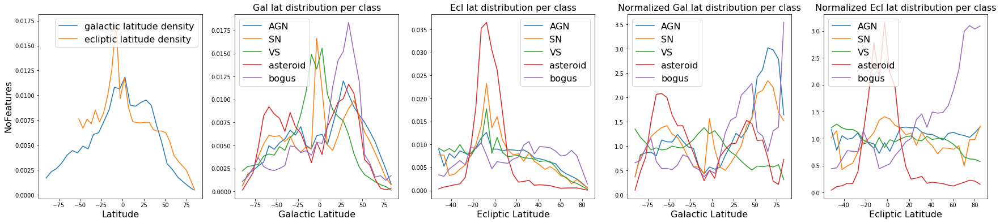

In [17]:
%matplotlib inline

features_list = ['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3',
                'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb',
                'distnr', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long',
                'gal_lat', 'gal_long', 'non_detections', "chinr", "sharpnr", "elong"]

features_clip = {"sgscore1": [-1, "max"], "distpsnr1": [-1, "max"], "sgscore2": [-1, "max"], "distpsnr2": [-1, "max"],
                 "sgscore3": [-1, "max"], "distpsnr3": [-1, "max"], "fwhm": ["min", 10], "distnr": [-1, "max"], "magnr": [-1, "max"],
                 "ndethist": ["min", 20], "ncovhist": ["min", 3000], "chinr": [-1, 15], "sharpnr": [-1, 1.5], "non_detections": ["min", 2000]}

model_names = ["AllFeatures", "distpsnr1_removed", "distnr_removed", "magnr_removed", "magpsf_removed", "sigmapsf_removed", "NoFeatures"]
features_removed = [None, "distpsnr1", "distnr", "magnr", "magpsf", "sigmapsf", None]

coordinates_df = pd.read_pickle('../../pickles/large_space_uniform/coordinate_df.pkl')
coordinates_df.set_index("oid", inplace=True)
list_of_frames = glob('../../pickles/large_space_uniform/unlabeled_set_images_*.pkl')


for i, model_key in enumerate(model_names):
    print("#################### " + model_key + " ########################")
    single_model_path = glob("../results/removing_features_testing/" + model_key + "_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_*")
    features_list, features_clip = remove_feature(features_list, features_clip, features_removed[i])
    
    if model_key == "NoFeatures":
        features_list = []
        with_features = False
    else:
        with_features = True
    
    data_dir = '../../pickles/'
    model_path = single_model_path[0]
    training_set_path = os.path.join(os.path.join(data_dir, "training_set_Jun-22-2020.pkl"))

    pred_file_name = os.path.join("../../pickles/large_space_uniform/", model_key+"_pred.pkl")
    prediction_df = pd.read_pickle(pred_file_name)
    
    preds_ids = []
    preds = []
    for ids, p, _ in prediction_df:
        preds_ids.append(ids)
        preds.append(p)
    preds_ids = np.concatenate(preds_ids)
    preds = np.concatenate(preds)
    
    plot_latitude_densities(coordinates_df, preds, preds_ids, title=model_key)

# distnr, magnr removed


Instructions for updating:
Use `for ... in dataset:` to iterate over a dataset. If using `tf.estimator`, return the `Dataset` object directly from your input function. As a last resort, you can use `tf.compat.v1.data.make_initializable_iterator(dataset)`.

Instructions for updating:
Use `tf.compat.v1.data.get_output_types(dataset)`.
Instructions for updating:
Use `tf.compat.v1.data.get_output_shapes(dataset)`.

Instructions for updating:
Use `tf.keras.layers.Conv2D` instead.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Use keras.layers.MaxPooling2D instead.
Instructions for updating:
Use keras.layers.flatten instead.
Instructions for updating:
Use keras.layers.dense instead.
Instructions for updating:
Use keras.layers.dropout instead.
Instructions for updating:
Use keras.layers.BatchNormalization instead.  In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be u

  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:34<00:00, 1526.76it/s]


Dumping to /home/rcarrasco/Projects/stamp_classifier/stamp_classifier/../pickles/converted_data.pkl...
Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 26)
Replicationg data from (array([0, 1, 2, 3, 4]), array([14542,  1396, 14523,  9599, 10534]))
to (array([0, 1, 2, 3, 4]), array([14542, 14542, 14542, 14542, 14542]))
Instructions for updating:
Use standard file APIs to check for files with this prefix.
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr-magnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200624-151522/checkpoints/model
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr-magnr_removed_EntropyRegBeta0.500

  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:34<00:00, 1509.86it/s]


Dumping to /home/rcarrasco/Projects/stamp_classifier/stamp_classifier/../pickles/converted_data.pkl...
Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 25)
Replicationg data from (array([0, 1, 2, 3, 4]), array([14542,  1396, 14523,  9599, 10534]))
to (array([0, 1, 2, 3, 4]), array([14542, 14542, 14542, 14542, 14542]))
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr-magnr-rb_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_0_20200624-152349/checkpoints/model
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr-magnr-rb_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200624-153757/chec

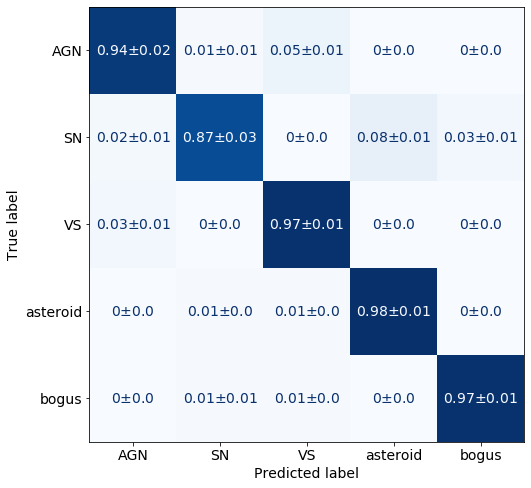

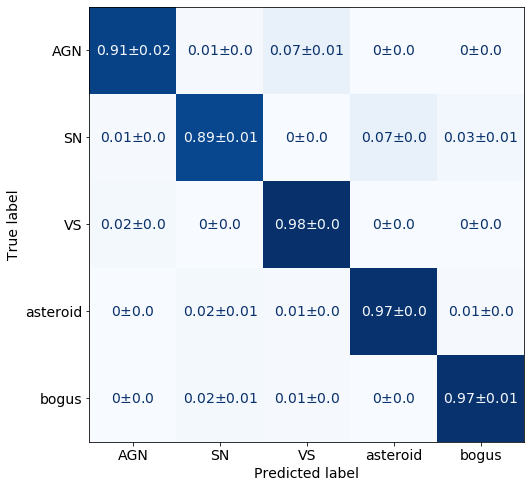

In [12]:
features_list = ['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3',
                'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb',
                'distnr', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long',
                'gal_lat', 'gal_long', 'non_detections', "chinr", "sharpnr", "elong"]

features_clip = {"sgscore1": [-1, "max"], "distpsnr1": [-1, "max"], "sgscore2": [-1, "max"], "distpsnr2": [-1, "max"],
                 "sgscore3": [-1, "max"], "distpsnr3": [-1, "max"], "fwhm": ["min", 10], "distnr": [-1, "max"], "magnr": [-1, "max"],
                 "ndethist": ["min", 20], "ncovhist": ["min", 3000], "chinr": [-1, 15], "sharpnr": [-1, 1.5], "non_detections": ["min", 2000]}

#f, ax = plt.subplots(1, 2, figsize=(12, 6))
f, ax = plt.subplots(1, 1, figsize=(8, 8))

# distnr, magnr removed
model_key = "distnr-magnr_removed"
features_list, features_clip = remove_feature(features_list, features_clip, "distnr")
features_list, features_clip = remove_feature(features_list, features_clip, "magnr")
single_model_path = glob("../results/removing_features_testing/" + model_key + "_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_*")
new_ax = return_cm_plot(model_paths=single_model_path, features_key=features_list, features_clip=features_clip, ax=ax)

# distnr, magnr and rb removed
f, ax = plt.subplots(1, 1, figsize=(8, 8))
model_key = "distnr-magnr-rb_removed"
features_list, features_clip = remove_feature(features_list, features_clip, "rb")
single_model_path = glob("../results/removing_features_testing/" + model_key + "_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_*")
new_ax = return_cm_plot(model_paths=single_model_path, features_key=features_list, features_clip=features_clip, ax=ax)

plt.show()

In [9]:
features_list = ['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3',
                'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb',
                'distnr', 'magnr', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long',
                'gal_lat', 'gal_long', 'non_detections', "chinr", "sharpnr", "elong"]

features_clip = {"sgscore1": [-1, "max"], "distpsnr1": [-1, "max"], "sgscore2": [-1, "max"], "distpsnr2": [-1, "max"],
                 "sgscore3": [-1, "max"], "distpsnr3": [-1, "max"], "fwhm": ["min", 10], "distnr": [-1, "max"], "magnr": [-1, "max"],
                 "ndethist": ["min", 20], "ncovhist": ["min", 3000], "chinr": [-1, 15], "sharpnr": [-1, 1.5], "non_detections": ["min", 2000]}

coordinates_df = pd.read_pickle('../../pickles/large_space_uniform/coordinate_df.pkl')
coordinates_df.set_index("oid", inplace=True)
list_of_frames = glob('../../pickles/large_space_uniform/unlabeled_set_images_*.pkl')
with_features = True

# distnr, magnr removed
model_key = "distnr-magnr_removed"
features_list, features_clip = remove_feature(features_list, features_clip, "distnr")
features_list, features_clip = remove_feature(features_list, features_clip, "magnr")
single_model_path = glob("../results/removing_features_testing/" + model_key + "_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_*")
data_dir = '../../pickles/'
model_path = single_model_path[0]
training_set_path = os.path.join(os.path.join(data_dir, "training_set_Jun-22-2020.pkl"))

prediction_df = []

for frame_path in list_of_frames:
    print(frame_path)
    predictions = get_predictions_of_chunk(frame_path, training_set_path, model_path, 
                                           with_features=with_features,  features_key=features_list,
                                           features_clip=features_clip)
    prediction_df.append(predictions)
    
pred_file_name = os.path.join("../../pickles/large_space_uniform/", model_key+"_pred.pkl")
pickle.dump(prediction_df, open(pred_file_name, 'wb'), protocol=2)

# distnr, magnr, rb removed
model_key = "distnr-magnr-rb_removed"
features_list, features_clip = remove_feature(features_list, features_clip, "rb")
single_model_path = glob("../results/removing_features_testing/" + model_key + "_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_*")
data_dir = '../../pickles/'
model_path = single_model_path[0]
training_set_path = os.path.join(os.path.join(data_dir, "training_set_Jun-22-2020.pkl"))

prediction_df = []

for frame_path in list_of_frames:
    print(frame_path)
    predictions = get_predictions_of_chunk(frame_path, training_set_path, model_path, 
                                           with_features=with_features,  features_key=features_list,
                                           features_clip=features_clip)
    prediction_df.append(predictions)
    
pred_file_name = os.path.join("../../pickles/large_space_uniform/", model_key+"_pred.pkl")
pickle.dump(prediction_df, open(pred_file_name, 'wb'), protocol=2)

../../pickles/large_space_uniform/unlabeled_set_images_2.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:33<00:00, 1561.55it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 26)


  0%|          | 0/75774 [00:00<?, ?it/s]

{'unlabeled': 0}


100%|██████████| 75774/75774 [00:47<00:00, 1597.95it/s]



927 misshaped samples removed

1688 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']

Instructions for updating:
Use `for ... in dataset:` to iterate over a dataset. If using `tf.estimator`, return the `Dataset` object directly from your input function. As a last resort, you can use `tf.compat.v1.data.make_initializable_iterator(dataset)`.

Instructions for updating:
Use `tf.compat.v1.data.get_output_types(dataset)`.
Instructions for updating:
Use `tf.compat.v1.data.get_output_shapes(dataset)`.

Instructions for updating:
Use `tf.keras.layers.Conv2D` instead.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing 

  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:35<00:00, 1461.59it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 26)


  0%|          | 0/78070 [00:00<?, ?it/s]

{'unlabeled': 0}


100%|██████████| 78070/78070 [00:50<00:00, 1541.70it/s]



1079 misshaped samples removed

2161 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr-magnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200624-151522/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_0.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:37<00:00, 1405.87it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 26)


  0%|          | 0/78598 [00:00<?, ?it/s]

{'unlabeled': 0}


100%|██████████| 78598/78598 [00:49<00:00, 1572.49it/s]



894 misshaped samples removed

2138 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr-magnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200624-151522/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_4.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:36<00:00, 1431.82it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 26)


  0%|          | 0/78848 [00:00<?, ?it/s]

{'unlabeled': 0}


100%|██████████| 78848/78848 [00:50<00:00, 1566.53it/s]



904 misshaped samples removed

2260 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr-magnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200624-151522/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_3.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:36<00:00, 1424.90it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 26)


  0%|          | 0/78209 [00:00<?, ?it/s]

{'unlabeled': 0}


100%|██████████| 78209/78209 [00:49<00:00, 1572.16it/s]



853 misshaped samples removed

2027 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'rb', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr-magnr_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_2_20200624-151522/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_2.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:35<00:00, 1463.95it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 25)


  0%|          | 0/75774 [00:00<?, ?it/s]

{'unlabeled': 0}


100%|██████████| 75774/75774 [00:48<00:00, 1556.04it/s]



927 misshaped samples removed

1688 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr-magnr-rb_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_0_20200624-152349/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_1.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:36<00:00, 1421.88it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 25)


  0%|          | 0/78070 [00:00<?, ?it/s]

{'unlabeled': 0}


100%|██████████| 78070/78070 [00:51<00:00, 1503.57it/s]



1079 misshaped samples removed

2161 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr-magnr-rb_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_0_20200624-152349/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_0.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:35<00:00, 1457.68it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 25)


  0%|          | 0/78598 [00:00<?, ?it/s]

{'unlabeled': 0}


100%|██████████| 78598/78598 [00:51<00:00, 1512.27it/s]



894 misshaped samples removed

2138 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr-magnr-rb_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_0_20200624-152349/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_4.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:36<00:00, 1419.16it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 25)


  0%|          | 0/78848 [00:00<?, ?it/s]

{'unlabeled': 0}


100%|██████████| 78848/78848 [00:46<00:00, 1678.98it/s]



904 misshaped samples removed

2260 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr-magnr-rb_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_0_20200624-152349/checkpoints/model
../../pickles/large_space_uniform/unlabeled_set_images_3.pkl


  0%|          | 0/52244 [00:00<?, ?it/s]

{'AGN': 0, 'SN': 1, 'VS': 2, 'asteroid': 3, 'bogus': 4}


100%|██████████| 52244/52244 [00:36<00:00, 1439.57it/s]


Label count AGN: 14966 -SN: 1620 -VS: 14996 -asteroid: 9899 -bogus: 10763 -
650 misshaped samples removed
Label count AGN: 14742 -SN: 1596 -VS: 14723 -asteroid: 9799 -bogus: 10734 -
2598 samples with NaNs. NaNs replaced with number 0
Calculating feature statistics for normalization, with set of size (50594, 25)


  0%|          | 0/78209 [00:00<?, ?it/s]

{'unlabeled': 0}


100%|██████████| 78209/78209 [00:50<00:00, 1542.68it/s]



853 misshaped samples removed

2027 samples with NaNs. NaNs replaced with number 0
###################### PRINTING PARAMS ##################
['sgscore1', 'distpsnr1', 'sgscore2', 'distpsnr2', 'sgscore3', 'distpsnr3', 'isdiffpos', 'fwhm', 'magpsf', 'sigmapsf', 'ra', 'dec', 'diffmaglim', 'classtar', 'ndethist', 'ncovhist', 'ecl_lat', 'ecl_long', 'gal_lat', 'gal_long', 'non_detections', 'chinr', 'sharpnr', 'elong']
INFO:tensorflow:Restoring parameters from ../results/removing_features_testing/distnr-magnr-rb_removed_EntropyRegBeta0.5000_batch64_lr0.00100_droprate0.5000_inputsize21_filtersize3_0_20200624-152349/checkpoints/model


#################### NoFeatures ########################


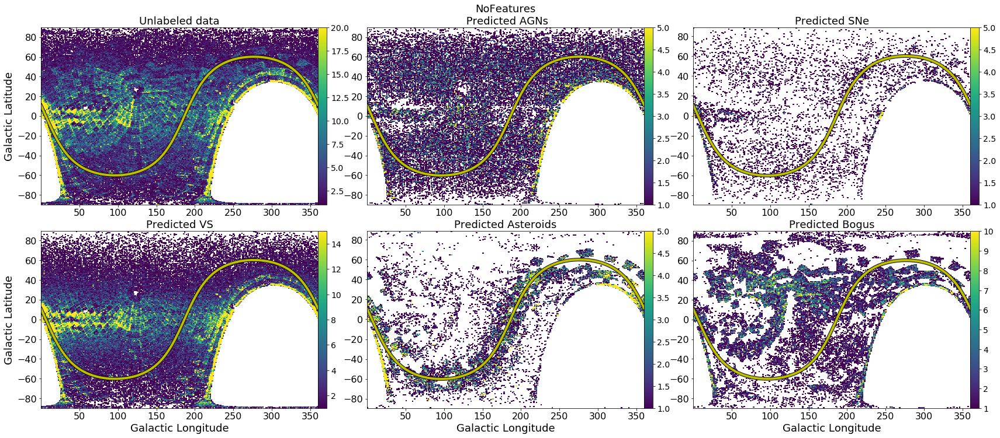

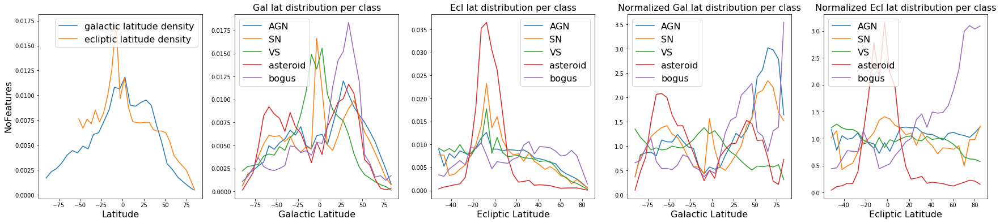

#################### distnr-magnr_removed ########################


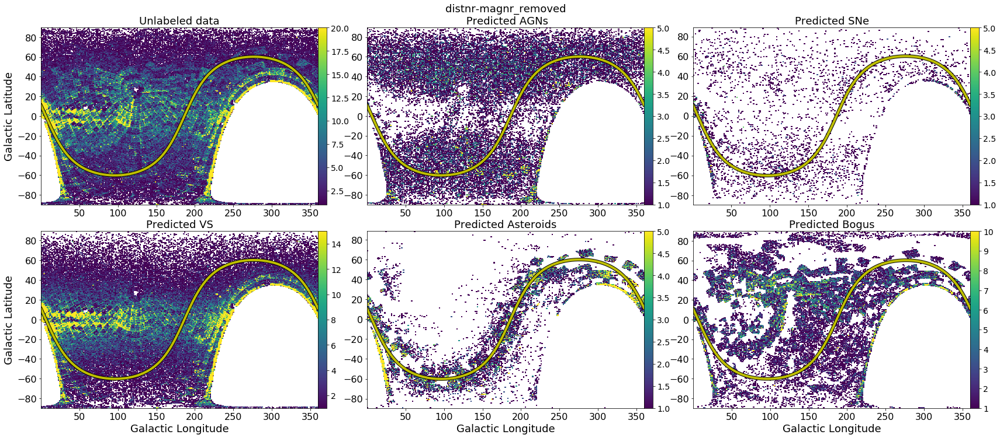

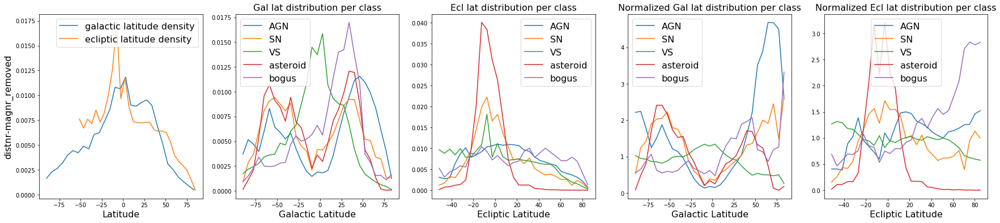

#################### distnr-magnr-rb_removed ########################


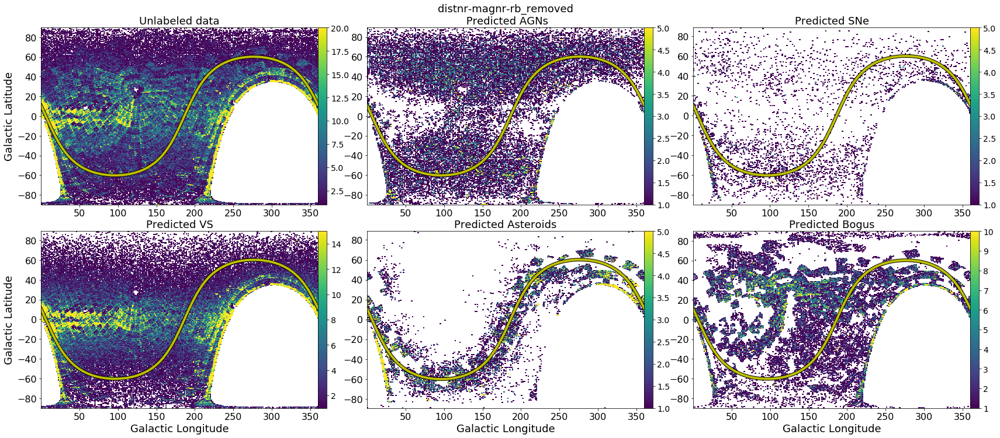

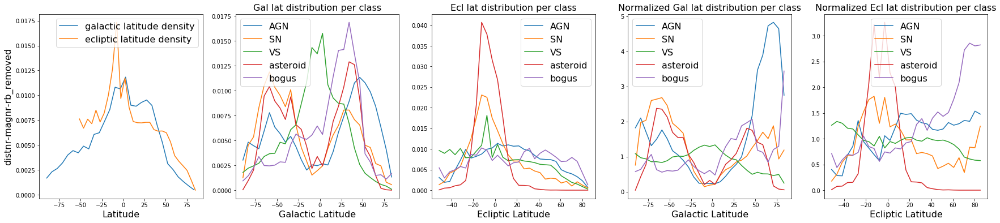

In [12]:
model_names = ["NoFeatures", "distnr-magnr_removed", "distnr-magnr-rb_removed"]

for i, model_key in enumerate(model_names):
    print("#################### " + model_key + " ########################")

    pred_file_name = os.path.join("../../pickles/large_space_uniform/", model_key+"_pred.pkl")
    prediction_df = pd.read_pickle(pred_file_name)
    
    preds_ids = []
    preds = []
    for ids, p, _ in prediction_df:
        preds_ids.append(ids)
        preds.append(p)
    preds_ids = np.concatenate(preds_ids)
    preds = np.concatenate(preds)
    
    
    f, ax = plt.subplots(2, 3, figsize=(3*10, 2*6))
    plt.subplots_adjust(wspace=0.0, hspace=0.15)
    ax = ax.flatten()
    vmax_values = [20, 5, 5, 15, 5, 10]
    cmin_values = [0.1, 0.1, 0.1, 0.1, 0.1, 0.1]
    titles = ["Unlabeled data", model_key+"\n Predicted AGNs", "Predicted SNe", "Predicted VS", "Predicted Asteroids", "Predicted Bogus"]
    fontsize = 18
    dims = ['gal_long', 'gal_lat']

    ecliptic_lat = np.linspace(0, 0, num=500)
    ecliptic_longi = np.linspace(0, 360, num=500)
    galact_long, galact_lat = ec2gal(ecliptic_longi, ecliptic_lat)

    for i in range(6):
        if i==0:
            _, _, _, im = ax[i].hist2d(coordinates_df[dims].values[:, 0], coordinates_df[dims].values[:, 1], (300, 300), cmap="viridis", vmax=vmax_values[i], cmin=cmin_values[i])
        else:
            oids_per_class = [preds_ids[preds==i-1] for cl in np.unique(preds)]
            df = coordinates_df.loc[oids_per_class[i-1]]
            _, _, _, im = ax[i].hist2d(df[dims].values[:, 0], df[dims].values[:, 1], (300, 300), cmap="viridis", vmax=vmax_values[i], cmin=cmin_values[i])
        if i==0 or i==3:
            ax[i].set_ylabel("Galactic Latitude", fontsize=fontsize)
        if i==3 or i==4 or i==5:
            ax[i].set_xlabel("Galactic Longitude", fontsize=fontsize)

        ax[i].tick_params(axis='both', labelsize=fontsize-2)
        cbar = plt.colorbar(im,ax=ax[i], pad=0)
        cbar.ax.tick_params(labelsize=fontsize-4)
        ax[i].set_title(titles[i], fontsize=fontsize)
        ax[i].plot(galact_long, galact_lat, "-k", lw=6)
        ax[i].plot(galact_long, galact_lat, "-y", lw=4)
    plt.show()
    
    plot_latitude_densities(coordinates_df, preds, preds_ids, title=model_key)

# Show some predictions per class

In [14]:
def search_images(oids):
    df_best_probs = []
    
    list_of_frames = glob('../../pickles/large_space_uniform/unlabeled_set_images_*.pkl')
    
    for frame_path in list_of_frames:
        print(frame_path)
        data = pd.read_pickle(frame_path)
        data.set_index("oid", inplace=True)
        
        for oid in oids:
            try:
                object_data = data.loc[oid]
                df_best_probs.append(object_data)
            except:
                continue
                
        if len(df_best_probs) == len(oids):
            return df_best_probs
        
    return df_best_probs

def get_image_from_bytes_stamp(stamp_byte):
    with gzip.open(io.BytesIO(stamp_byte), 'rb') as f:
        with fits.open(io.BytesIO(f.read())) as hdul:
         img = hdul[0].data
    return img

In [23]:
n_examples = 20
model_key = "distnr-magnr_removed"
pred_file_name = os.path.join("../../pickles/large_space_uniform/", model_key+"_pred.pkl")
prediction_df = pd.read_pickle(pred_file_name)

preds_ids = []
preds = []
probabilities = []
for ids, p, proba in prediction_df:
    preds_ids.append(ids)
    preds.append(p)
    probabilities.append(proba)
preds_ids = np.concatenate(preds_ids)
preds = np.concatenate(preds)
probabilities = np.concatenate(probabilities)

objects_per_class = {}
for c in np.unique(preds):
    print("label", c)
    class_indexes = np.where(preds==c)[0]
    
    class_probabilities = probabilities[class_indexes][:, c]
    print(class_probabilities.shape)
    class_ids = preds_ids[class_indexes]
    
    sorted_probs_indexes = np.argsort(class_probabilities)
    best_probs = class_probabilities[sorted_probs_indexes][-n_examples:]
    best_ids = class_ids[sorted_probs_indexes][-n_examples:]
    print(best_ids)
    
    best_objects = search_images(best_ids)
    objects_per_class[c] = best_objects

label 0
(38030,)
['ZTF18abxrqur' 'ZTF18abjflow' 'ZTF18aazxdyy' 'ZTF18acvhupi'
 'ZTF19aatevrr' 'ZTF18acurjap' 'ZTF19aahvneb' 'ZTF18actbijp'
 'ZTF18aaxrqzn' 'ZTF18aawwzhv' 'ZTF18abodptn' 'ZTF18acvwcss'
 'ZTF18acvweld' 'ZTF18acussdv' 'ZTF18aamfvoz' 'ZTF18acvvyaz'
 'ZTF18acvjhht' 'ZTF19aafltef' 'ZTF18adbilsx' 'ZTF18aavhvdc']
../../pickles/large_space_uniform/unlabeled_set_images_2.pkl
../../pickles/large_space_uniform/unlabeled_set_images_1.pkl
../../pickles/large_space_uniform/unlabeled_set_images_0.pkl
../../pickles/large_space_uniform/unlabeled_set_images_4.pkl
../../pickles/large_space_uniform/unlabeled_set_images_3.pkl
label 1
(4072,)
['ZTF18abwbaim' 'ZTF20abahsdf' 'ZTF18aabsyqp' 'ZTF19abceisp'
 'ZTF18aceiqor' 'ZTF18aakoylt' 'ZTF18abqdwze' 'ZTF19abyemgl'
 'ZTF19acjwdnu' 'ZTF19aalbrgu' 'ZTF19abnacvf' 'ZTF19aaduufr'
 'ZTF19acamgfb' 'ZTF19abujuex' 'ZTF19abiqpux' 'ZTF19abjpelp'
 'ZTF20aahsoxh' 'ZTF18aakydia' 'ZTF18aarlbnr' 'ZTF18aczdetm']
../../pickles/large_space_uniform/unlabeled_set_im

In [25]:
objects_per_class[0]

[class                                                       unlabeled
 cutoutScience       b'\x1f\x8b\x08\x00\xb1\x08\x11\\\x02\x03\xed\x...
 cutoutTemplate      b'\x1f\x8b\x08\x00\xb1\x08\x11\\\x02\x03\xed\x...
 cutoutDifference    b'\x1f\x8b\x08\x00\xb1\x08\x11\\\x02\x03\xed\x...
 sgscore1                                                         -999
 distpsnr1                                                        -999
 sgscore2                                                         -999
 distpsnr2                                                        -999
 sgscore3                                                         -999
 distpsnr3                                                        -999
 isdiffpos                                                           f
 fwhm                                                             2.51
 magpsf                                                        20.1027
 sigmapsf                                                     0.173433
 ra   